<a href="https://colab.research.google.com/github/sankichi92/satelliteBook/blob/main/notebooks/6-classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 第6章 衛星データ解析手法別演習 [分類編]

[『Pythonで学ぶ衛星データ解析基礎』](https://gihyo.jp/book/2022/978-4-297-13232-3)より。

In [1]:
!date --rfc-3339=seconds

2023-01-09 14:52:34+00:00


In [2]:
!python --version

Python 3.8.16


In [3]:
!pip install japanize-matplotlib>=1.1.3 geopandas>=0.12.2 mapclassify pystac-client>=0.5.1 rioxarray>=0.13.3

In [4]:
%config InlineBackend.figure_formats = ['retina']

In [5]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['figure.dpi'] = 100

import japanize_matplotlib

In [6]:
import numpy as np
np.random.seed(42)

演習用の土地被覆クラスデータセットを読み込む。

In [7]:
import geopandas as gpd
landcover_gdf = gpd.read_file('https://github.com/sankichi92/satelliteBook/raw/main/data/stratified_points.gpkg')
landcover_gdf['label'] = landcover_gdf['data'].replace({1: '水域', 2: '人工物', 3: '草地・農地', 4: '森林'})
landcover_gdf

,y,x,data,geometry,label
0,42.979958,144.355375,1,POINT (144.35538 42.97996),水域
1,42.979542,144.349375,1,POINT (144.34938 42.97954),水域
2,42.968458,144.352375,1,POINT (144.35237 42.96846),水域
3,42.957625,144.367875,1,POINT (144.36787 42.95763),水域
4,42.979292,144.354458,1,POINT (144.35446 42.97929),水域
...,...,...,...,...,...
1995,42.984708,144.443708,4,POINT (144.44371 42.98471),森林
1996,43.008125,144.505208,4,POINT (144.50521 43.00812),森林
1997,43.047542,144.468958,4,POINT (144.46896 43.04754),森林
1998,42.996292,144.506792,4,POINT (144.50679 42.99629),森林


In [8]:
landcover_gdf.explore('label')

データセットの領域で被雲率の低い Sentinel-2 データを Earth Search で検索する。

In [9]:
from pystac_client import Client

client = Client.open('https://earth-search.aws.element84.com/v0')
res = client.search(
    collections='sentinel-s2-l2a-cogs',
    bbox=landcover_gdf.total_bounds,
    datetime='2022-04/2022-09',
    query=['eo:cloud_cover<1', 'sentinel:valid_cloud_cover=true']
)
res.matched()

2

In [10]:
item = min(res.items(), key=lambda item: item.properties['eo:cloud_cover'])
item

ID: S2B_54TYN_20220822_0_L2A
"Bounding Box: [143.42730802334125, 42.3024609991612, 144.81811084166517, 43.32624770923024]"
Datetime: 2022-08-22 01:25:17+00:00
datetime: 2022-08-22T01:25:17Z
platform: sentinel-2b
constellation: sentinel-2
instruments: ['msi']
gsd: 10
view:off_nadir: 0
proj:epsg: 32654
sentinel:utm_zone: 54


In [11]:
from IPython.display import Image
Image(url=item.assets['thumbnail'].href)

検索結果のバンドデータを xarray.DataArray として読み込む。

In [12]:
import rioxarray
import xarray as xr

band_names = ['B02', 'B03', 'B04', 'B08']
aoi_data = []
for band_name in band_names:
  band = rioxarray.open_rasterio(item.assets[band_name].href)
  band = band.rio.reproject(landcover_gdf.crs)
  band = band.rio.clip_box(*landcover_gdf.total_bounds)
  aoi_data.append(band)

aoi_data = xr.concat(aoi_data, dim='band').assign_coords(band=band_names)
aoi_data

<xarray.DataArray (band: 4, y: 887, x: 1657)>
array([[[ 329,  324,  312, ...,  294,  284,  286],
        [ 352,  352,  347, ...,  300,  318,  319],
        [ 353,  338,  316, ...,  310,  312,  312],
        ...,
        [ 273,  264,  264, ...,  213,  221,  232],
        [ 259,  250,  247, ...,  225,  230,  234],
        [ 272,  258,  278, ...,  222,  222,  240]],

       [[ 634,  586,  603, ...,  656,  606,  626],
        [ 672,  672,  654, ...,  708,  688,  638],
        [ 693,  640,  601, ...,  715,  688,  642],
        ...,
        [ 249,  258,  258, ...,  419,  353,  396],
        [ 273,  262,  281, ...,  444,  392,  428],
        [ 306,  287,  281, ...,  367,  374,  433]],

       [[ 360,  320,  330, ...,  300,  296,  322],
        [ 389,  396,  395, ...,  334,  348,  359],
        [ 394,  368,  331, ...,  315,  337,  360],
        ...,
        [ 152,  143,  143, ...,  194,  190,  198],
        [ 156,  152,  150, ...,  198,  195,  198],
        [ 154,  152,  142, ...,  190,  184,  196]],

       [[3932, 3933, 3824, ..., 3992, 3595, 3507],
        [3840, 3905, 3730, ..., 3837, 3688, 3544],
        [3894, 3871, 3664, ..., 3852, 3652, 3480],
        ...,
        [  82,   91,   91, ..., 4392, 4064, 4440],
        [  93,   90,  110, ..., 4642, 4559, 4640],
        [  98,  109,   97, ..., 4464, 4283, 4500]]], dtype=uint16)
Coordinates:
  * x            (x) float64 144.3 144.3 144.3 144.3 ... 144.5 144.5 144.5 144.5
  * y            (y) float64 43.05 43.05 43.05 43.05 ... 42.96 42.96 42.96 42.96
  * band         (band) <U3 'B02' 'B03' 'B04' 'B08'
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:       Area
    OVR_RESAMPLING_ALG:  AVERAGE
    scale_factor:        1.0
    add_offset:          0.0
    _FillValue:          0

検索結果のトゥルーカラー画像上に土地被覆クラスを表示する。

Text(0.5, 1.0, '土地被覆分類とトゥルーカラー画像')

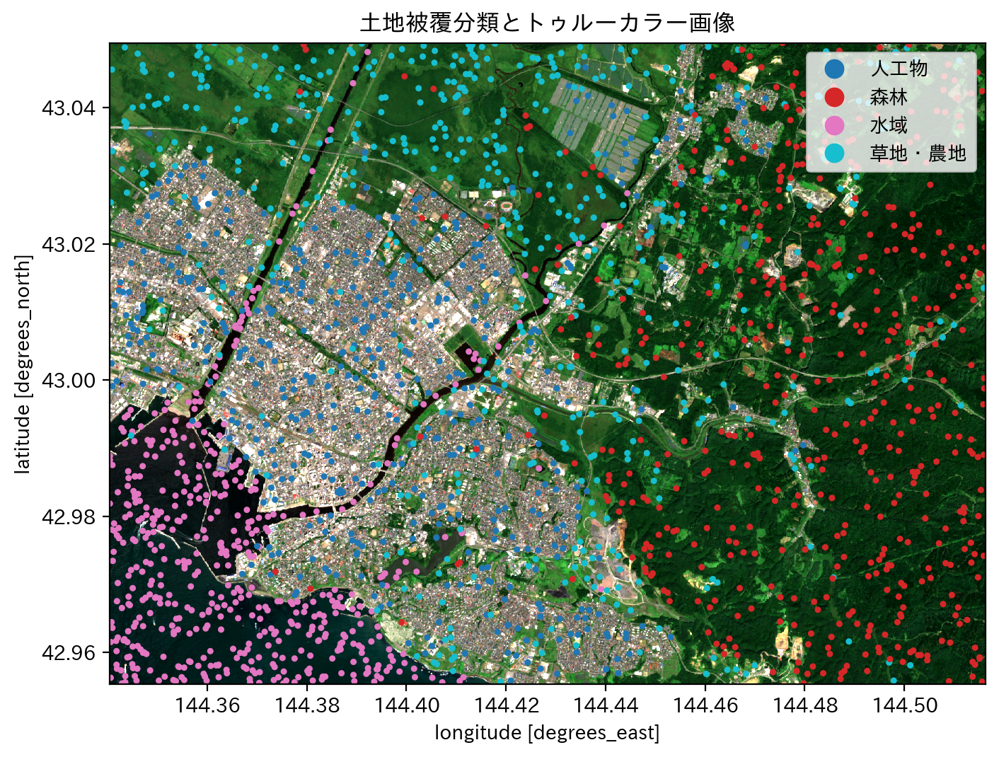

In [13]:
_fig, ax = plt.subplots()
aoi_data.sel(band=['B04', 'B03', 'B02']).plot.imshow(rgb='band', robust=True, ax=ax)
landcover_gdf.plot('label', legend=True, markersize=5, ax=ax)
ax.set_title('土地被覆分類とトゥルーカラー画像')

土地被覆クラスの Point の場所に対応するバンドデータの値を取得する。

In [14]:
import numpy as np
point_values = np.stack([aoi_data.sel(x=point.x, y=point.y, method='nearest').values for point in landcover_gdf.geometry])
point_values.shape

(2000, 4)

バンドデータの値を説明変数、土地被覆クラスを目的変数として、訓練データとテストデータを分ける。

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    point_values,
    landcover_gdf['data'].values,
    test_size=0.2,
)
X_train.shape, y_test.shape

((1600, 4), (400,))

各種アルゴリズムでモデルを作成し、テストデータでのスコア計算と全ピクセルについての出力結果の画像表示を行う。

In [16]:
X = aoi_data.transpose('y', 'x', 'band').values.reshape(-1, 4)
image_shape = (aoi_data.coords['y'].size, aoi_data.coords['x'].size)

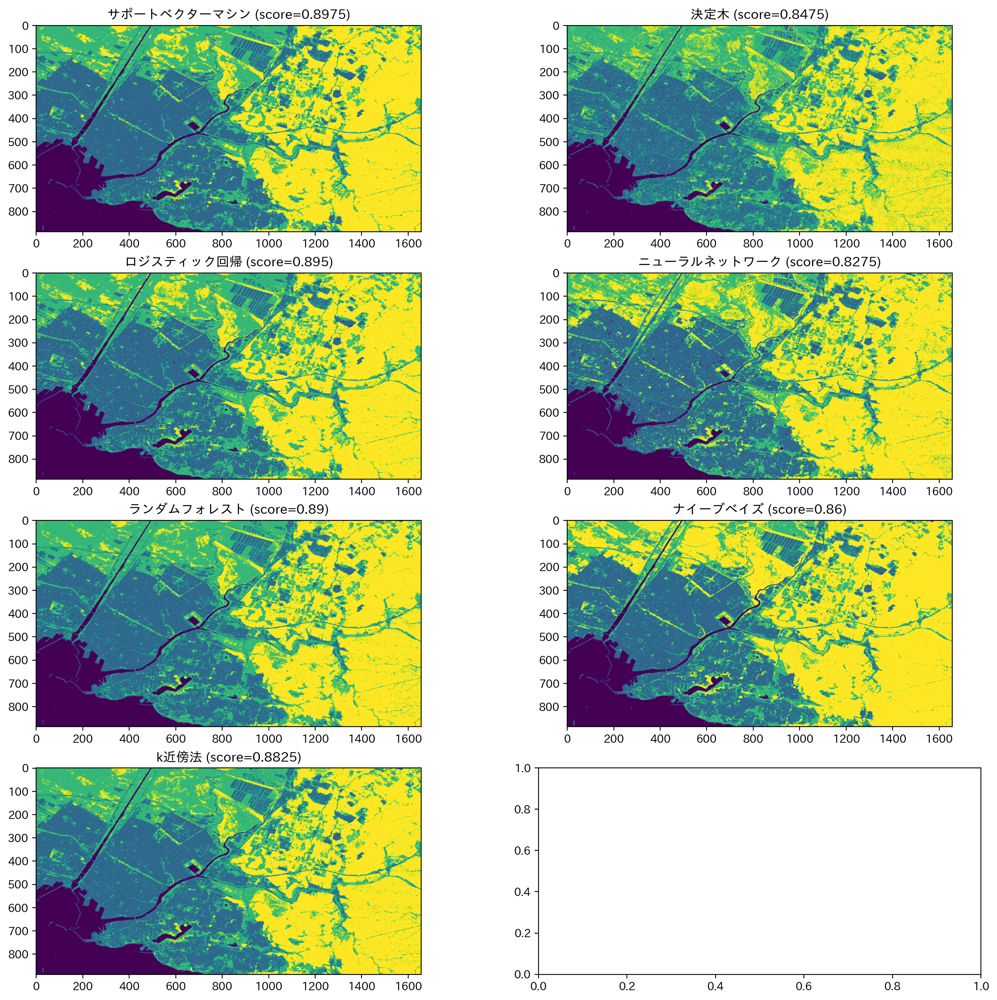

In [17]:
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

name_to_model = {
    'サポートベクターマシン': SVC(),
    '決定木': DecisionTreeClassifier(),
    'ロジスティック回帰': LogisticRegression(max_iter=2000), # ConvergenceWarning を抑制するため、max_iter を増加
    'ニューラルネットワーク': MLPClassifier(),
    'ランダムフォレスト': RandomForestClassifier(),
    'ナイーブベイズ': GaussianNB(),
    'k近傍法': KNeighborsClassifier()
}

nrows = (len(name_to_model) + 1) // 2
_fig, axs = plt.subplots(nrows, 2, figsize=(16, nrows * 4))

scores = []
for ax, (name, model) in zip(axs.flat, name_to_model.items()):
  model.fit(X_train, y_train)
  score = model.score(X_test, y_test)
  ax.set_title(f'{name} (score={score})')
  
  predict = model.predict(X)
  ax.imshow(predict.reshape(image_shape))

教師なし学習の例として、k平均法によるクラスタリングを行う。

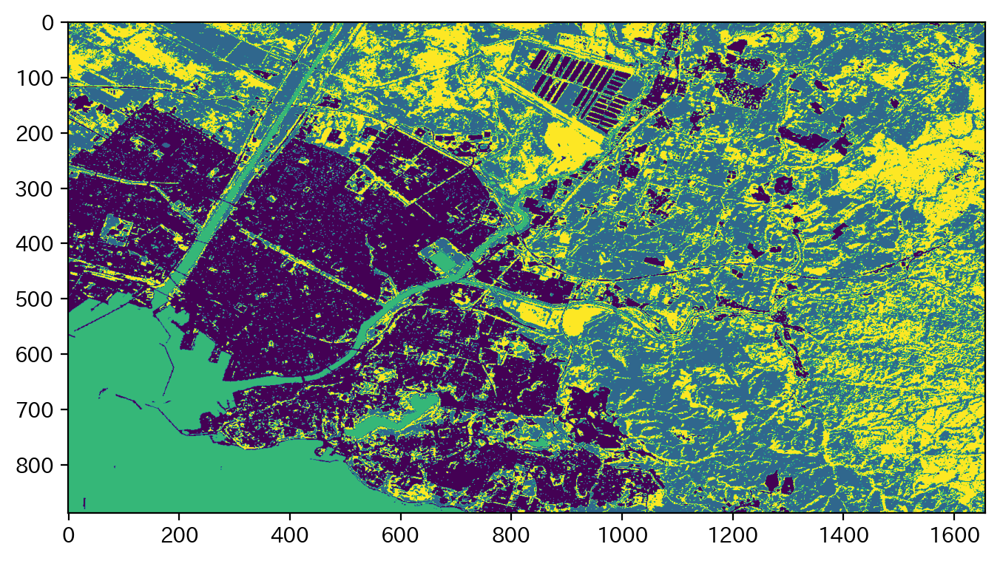

In [18]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=4)
y = km.fit_predict(X)
plt.imshow(y.reshape(image_shape))